
Results for scale factor X2:


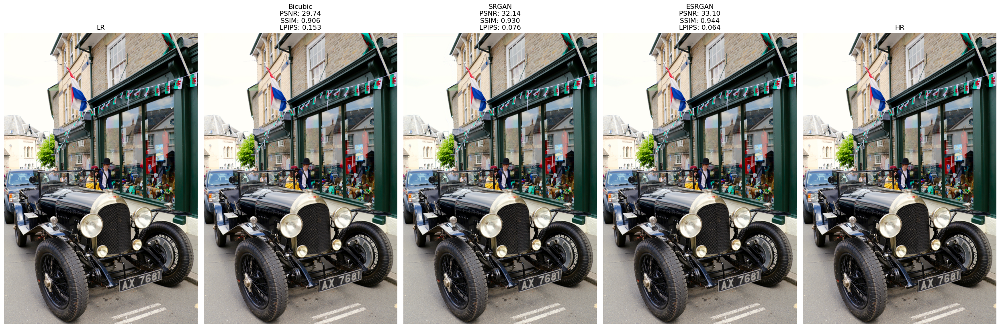


Results for scale factor X4:


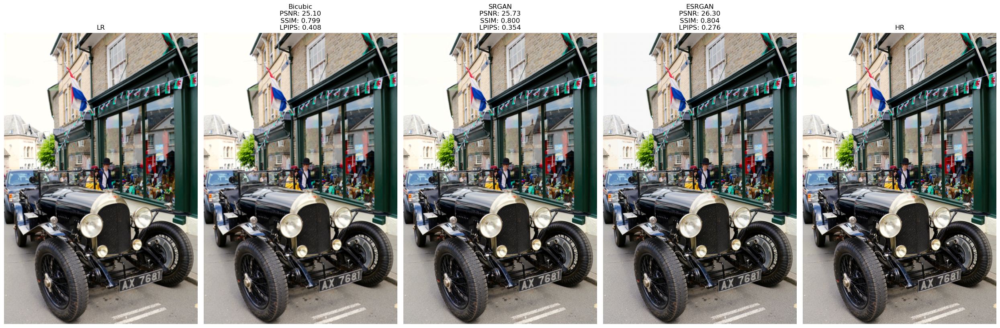


Results for scale factor X8:


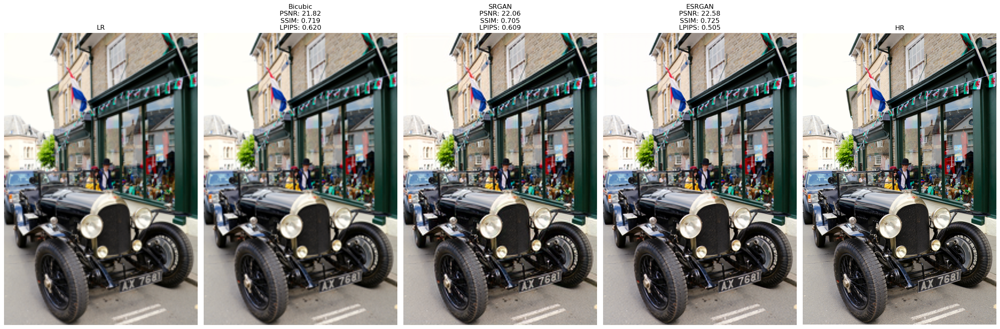

In [15]:
import os
import io
import cv2
import shutil
import tempfile
import contextlib
import torch
import lpips
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from pytorch_fid import fid_score

def load_and_preprocess(image_path):
    """
    Loads an image from disk, converts it to a torch tensor, and normalizes it to [-1, 1]
    (which is expected by the LPIPS model).

    Parameters:
        image_path (str): Path to the image.

    Returns:
        torch.Tensor: A tensor with shape (1, 3, H, W) normalized to [-1, 1].
    """
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {image_path}")
    # Convert to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Convert to float32 and scale to [0, 1]
    img = img.astype(np.float32) / 255.0
    # Normalize to [-1, 1]
    img = (img - 0.5) * 2
    # Convert to torch tensor; shape becomes (1, 3, H, W)
    img_tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0)
    return img_tensor

def center_crop_tensor(img, target_height, target_width):
    """
    Center crops a tensor image.

    Parameters:
        img (torch.Tensor): Tensor of shape (1, C, H, W).
        target_height (int): Target height.
        target_width (int): Target width.

    Returns:
        torch.Tensor: Center-cropped image.
    """
    _, _, height, width = img.shape
    top = (height - target_height) // 2
    left = (width - target_width) // 2
    return img[:, :, top:top+target_height, left:left+target_width]

def crop_to_common_size_tensor(img1, img2):
    """
    Crops two tensor images to their smallest common spatial dimensions.

    Parameters:
        img1, img2 (torch.Tensor): Tensors of shape (1, C, H, W).

    Returns:
        tuple: Cropped tensors with the same spatial dimensions.
    """
    _, _, h1, w1 = img1.shape
    _, _, h2, w2 = img2.shape
    common_h = min(h1, h2)
    common_w = min(w1, w2)
    return center_crop_tensor(img1, common_h, common_w), center_crop_tensor(img2, common_h, common_w)

def compute_lpips(image_path1, image_path2, model='alex'):
    """
    Computes the LPIPS distance between two images.

    Parameters:
        image_path1 (str): Path to the first image.
        image_path2 (str): Path to the second image.
        model (str): Which LPIPS backbone to use ('alex', 'vgg', or 'squeeze').

    Returns:
        float: LPIPS distance (lower means more similar).
    """
    img1 = load_and_preprocess(image_path1)
    img2 = load_and_preprocess(image_path2)
    # Crop tensors if sizes differ.
    if img1.shape != img2.shape:
        img1, img2 = crop_to_common_size_tensor(img1, img2)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    img1, img2 = img1.to(device), img2.to(device)
    f = io.StringIO() # To prevent prints from the LPIPS function from appearing
    with contextlib.redirect_stdout(f):
        loss_fn = lpips.LPIPS(net=model).to(device)
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()
    return distance

def compute_lpips_for_methods(image_name, scale_factor, model='alex'):
    """
    Computes LPIPS for three upscaled versions (Bicubic, SRGAN, ESRGAN) relative to the HR image.

    Assumed file structure:
      - HR:    DIV2K/DIV2K_valid_HR/image_name
      - Bicubic: results/bicubic/X{scale_factor}/image_name
      - SRGAN: results/X{scale_factor}/sr_{image_name}
      - ESRGAN: results/X{scale_factor}/esr_{image_name}

    Parameters:
        image_name (str): The image filename (e.g. "0847.png").
        scale_factor (int): Upscale factor.
        model (str): LPIPS backbone.

    Returns:
        dict: LPIPS distances for 'bicubic', 'srgan', and 'esrgan'.
    """
    hr_path = os.path.join("DIV2K", "DIV2K_valid_HR", image_name)
    bicubic_path = os.path.join("results", "bicubic", f"X{scale_factor}", image_name)
    srgan_path = os.path.join("results", f"X{scale_factor}", f"sr_{image_name}")
    esrgan_path = os.path.join("results", f"X{scale_factor}", f"esr_{image_name}")
    
    lpips_bicubic = compute_lpips(hr_path, bicubic_path, model)
    lpips_srgan   = compute_lpips(hr_path, srgan_path, model)
    lpips_esrgan  = compute_lpips(hr_path, esrgan_path, model)
    
    return {
        'bicubic': lpips_bicubic,
        'srgan': lpips_srgan,
        'esrgan': lpips_esrgan,
    }

def crop_to_match_np(img, target_img):
    """
    Center crops the first image (numpy array) to match the dimensions of target_img.

    Parameters:
        img (np.ndarray): Source image.
        target_img (np.ndarray): Target image whose dimensions will be used.

    Returns:
        np.ndarray: Cropped version of img.
    """
    h1, w1, _ = img.shape
    h2, w2, _ = target_img.shape
    new_h = min(h1, h2)
    new_w = min(w1, w2)
    top = (h1 - new_h) // 2
    left = (w1 - new_w) // 2
    return img[top:top+new_h, left:left+new_w, :]



def display_results(image_name, scale_factor, lpips_model='alex'):
    """
    Displays LR, Bicubic, SRGAN, ESRGAN, and HR images side by side.
    Also computes PSNR, SSIM, and LPIPS for each upscaled image against HR.
    If dimensions differ, HR (or upscaled) is center cropped to the smallest common size.

    Assumed file structure:
      - LR:       DIV2K/DIV2K_valid_LR/X{scale_factor}/image_name
      - HR:       DIV2K/DIV2K_valid_HR/image_name
      - Bicubic:  results/bicubic/X{scale_factor}/image_name
      - SRGAN:    results/X{scale_factor}/sr_{image_name}
      - ESRGAN:   results/X{scale_factor}/esr_{image_name}
    """
    # Define file paths.
    lr_path = os.path.join("DIV2K", "DIV2K_valid_LR", f"X{scale_factor}", image_name)
    hr_path = os.path.join("DIV2K", "DIV2K_valid_HR", image_name)
    bicubic_path = os.path.join("results", "bicubic", f"X{scale_factor}", image_name)
    srgan_path = os.path.join("results", f"X{scale_factor}", f"sr_{image_name}")
    esrgan_path = os.path.join("results", f"X{scale_factor}", f"esr_{image_name}")
    
    def read_image(path):
        img = cv2.imread(path)
        if img is None:
            raise FileNotFoundError(f"Image not found: {path}")
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Load images as numpy arrays.
    lr = read_image(lr_path)
    hr = read_image(hr_path)
    bicubic = read_image(bicubic_path)
    srgan = read_image(srgan_path)
    esrgan = read_image(esrgan_path)
    
    # Define helper to compute PSNR and SSIM with cropping if needed.
    def calc_metrics(upscaled):
        # Crop HR to match upscaled if dimensions differ.
        if hr.shape != upscaled.shape:
            hr_matched = crop_to_match_np(hr, upscaled)
        else:
            hr_matched = hr
        psnr = peak_signal_noise_ratio(hr_matched, upscaled)
        ssim = structural_similarity(hr_matched, upscaled, win_size=3, multichannel=True)
        return psnr, ssim
    
    psnr_bicubic, ssim_bicubic = calc_metrics(bicubic)
    psnr_srgan, ssim_srgan = calc_metrics(srgan)
    psnr_esrgan, ssim_esrgan = calc_metrics(esrgan)
    
    # Compute LPIPS scores (LPIPS is computed using torch tensors)
    lpips_results = compute_lpips_for_methods(image_name, scale_factor, model=lpips_model)
    
    # Create a figure with 5 subplots.
    fig, axes = plt.subplots(1, 5, figsize=(25, 25))
    
    # Display LR image.
    axes[0].imshow(lr)
    axes[0].set_title("LR")
    axes[0].axis('off')
    
    # Display Bicubic image with metrics.
    axes[1].imshow(bicubic)
    axes[1].set_title(f"Bicubic\nPSNR: {psnr_bicubic:.2f}\nSSIM: {ssim_bicubic:.3f}\nLPIPS: {lpips_results['bicubic']:.3f}")
    axes[1].axis('off')
    
    # Display SRGAN image with metrics.
    axes[2].imshow(srgan)
    axes[2].set_title(f"SRGAN\nPSNR: {psnr_srgan:.2f}\nSSIM: {ssim_srgan:.3f}\nLPIPS: {lpips_results['srgan']:.3f}")
    axes[2].axis('off')
    
    # Display ESRGAN image with metrics.
    axes[3].imshow(esrgan)
    axes[3].set_title(f"ESRGAN\nPSNR: {psnr_esrgan:.2f}\nSSIM: {ssim_esrgan:.3f}\nLPIPS: {lpips_results['esrgan']:.3f}")
    axes[3].axis('off')
    
    # Display HR image.
    axes[4].imshow(hr)
    axes[4].set_title("HR")
    axes[4].axis('off')
    
    plt.tight_layout()
    plt.show()

test_image = "0847.png"
scales = [2, 4, 8]
for scale in scales:
    print(f"\nResults for scale factor X{scale}:")
    display_results(test_image, scale, lpips_model='alex')


Scale X2


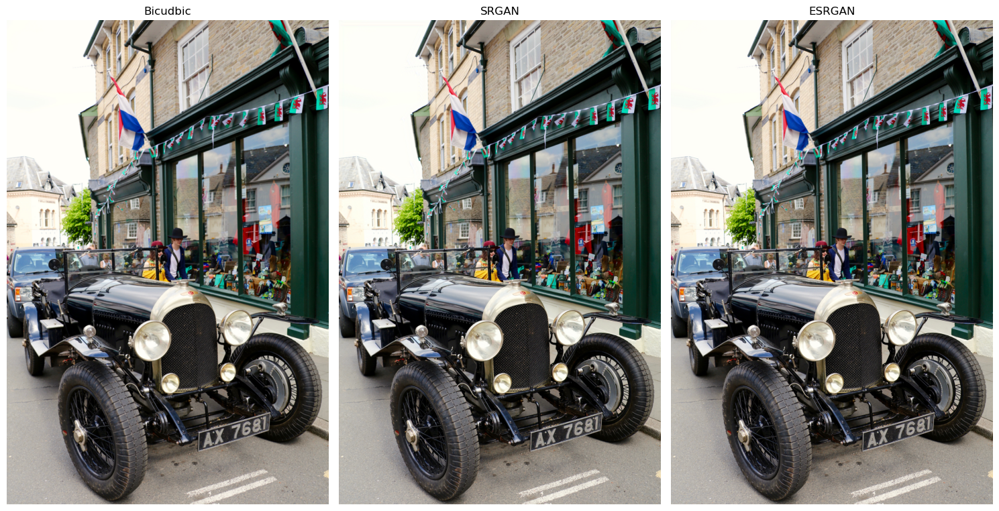

Scale X4


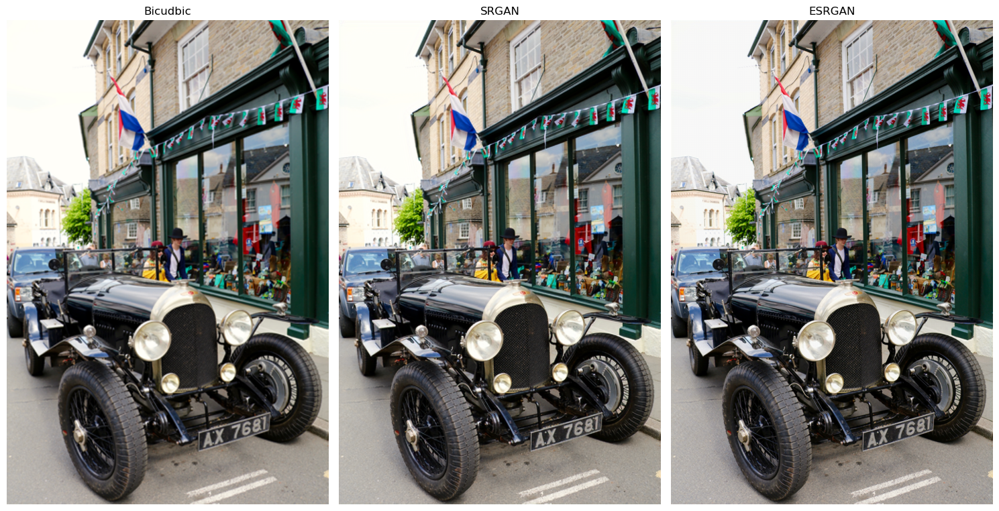

Scale X8


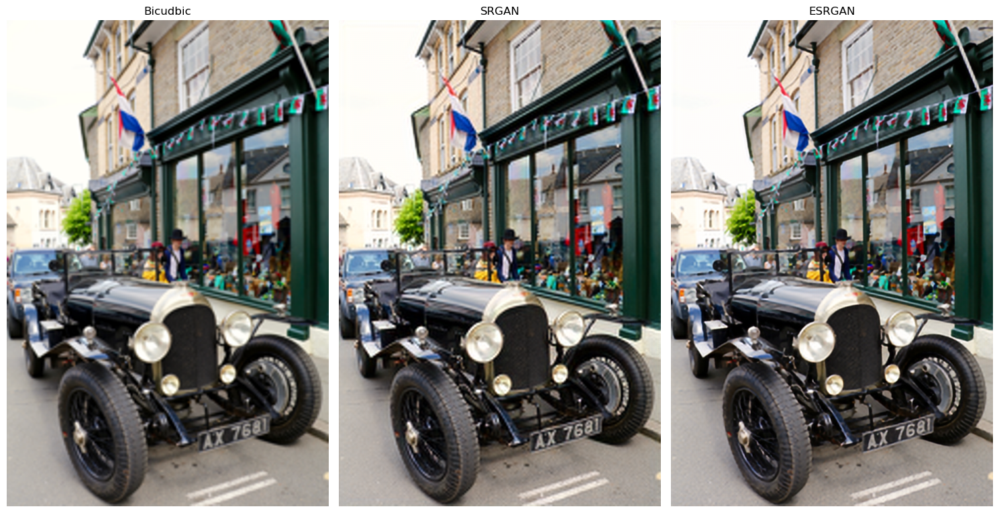

In [2]:
def display_esrgan_vs_srgan(image_name, scale_factor):
    """
    Displays the ESRGAN and SRGAN images side by side for the given image.
    
    Parameters:
        image_name (str): The filename of the image (e.g., "0802.png").
        scale_factor (int): The upscale factor (e.g., 2, 4, or 8).
    
    File paths are assumed to be:
        SRGAN: results/X{scale_factor}/sr_{image_name}
        ESRGAN: results/X{scale_factor}/esr_{image_name}
    """
    bicubic_path = os.path.join("results", "bicubic", f"X{scale_factor}", image_name)
    srgan_path = os.path.join("results", f"X{scale_factor}", f"sr_{image_name}")
    esrgan_path = os.path.join("results", f"X{scale_factor}", f"esr_{image_name}")
    
    def read_image(path):
        img = cv2.imread(path)
        if img is None:
            raise FileNotFoundError(f"Image not found: {path}")
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bicubic_img = read_image(bicubic_path)
    srgan_img = read_image(srgan_path)
    esrgan_img = read_image(esrgan_path)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 15))

    axes[0].imshow(bicubic_img)
    axes[0].set_title("Bicudbic")
    axes[0].axis("off")
    
    axes[1].imshow(srgan_img)
    axes[1].set_title("SRGAN")
    axes[1].axis("off")
    
    axes[2].imshow(esrgan_img)
    axes[2].set_title("ESRGAN")
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()


# Display a comparison between ESRGAN and SRGAN images.
scales = [2, 4, 8]
for scale in scales:
    print(f"Scale X{scale}")
    test_image = "0847.png"
    display_esrgan_vs_srgan(test_image, scale)

In [3]:
def prepare_method_directory(method, scale_factor):
    """
    Prepare a directory containing only the images for the given method.
    For bicubic images the folder already contains only bicubic images.
    For srgan and esrgan images (stored together) this function copies the images 
    with the proper prefix to a temporary folder.
    
    Parameters:
        method (str): One of 'bicubic', 'srgan', or 'esrgan'.
        scale_factor (int): Upscaling factor.
        
    Returns:
        temp_dir (str): Path to the directory containing only the images for that method.
        is_temp (bool): True if a temporary directory was created.
    """
    if method == 'bicubic':
        # For bicubic, images are stored separately.
        return os.path.join("results", "bicubic", f"X{scale_factor}"), False
    elif method in ['srgan', 'esrgan']:
        src_dir = os.path.join("results", f"X{scale_factor}")
        temp_dir = tempfile.mkdtemp()
        if method == 'srgan':
            prefix = "sr_"
        else:
            prefix = "esr_"
        for fname in os.listdir(src_dir):
            if fname.startswith(prefix):
                shutil.copy(os.path.join(src_dir, fname), os.path.join(temp_dir, fname))
        return temp_dir, True
    else:
        raise ValueError("Method must be one of: 'bicubic', 'srgan', 'esrgan'.")

def calculate_fid_for_methods(scale_factor):
    """
    For a given scale factor, compute the FID score between the HR images and each of the 
    generated image sets: bicubic, srgan, and esrgan.
    
    Assumes:
        HR images are in: DIV2K/DIV2K_valid_HR
        LR images are not used for FID.
        Bicubic images: results/bicubic/X{scale_factor}/
        SRGAN & ESRGAN images: results/X{scale_factor}/ (prefixed with "sr_" and "esr_")
    
    Parameters:
        scale_factor (int): The upscale factor (e.g., 2, 4, or 8).
        
    Returns:
        fid_scores (dict): Dictionary with keys 'bicubic', 'srgan', and 'esrgan'
                           and their corresponding FID values.
    """
    # Define the directory with high resolution images.
    hr_dir = os.path.join("DIV2K", "DIV2K_valid_HR")
    
    methods = ['bicubic', 'srgan', 'esrgan']
    fid_scores = {}
    
    # Use GPU if available.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch_size = 1
    dims = 2048
    
    for method in methods:
        method_dir, is_temp = prepare_method_directory(method, scale_factor)
        # Calculate FID using pytorch-fid.
        fid_value = fid_score.calculate_fid_given_paths([hr_dir, method_dir],
                                                          batch_size,
                                                          device,
                                                          dims)
        fid_scores[method] = fid_value
        
        # Clean up temporary directory if one was created.
        if is_temp:
            shutil.rmtree(method_dir)
    
    return fid_scores

# Calculate FID scores for scales.
scales = [2, 4, 8]
for scale in scales:
    fid_results = calculate_fid_for_methods(scale)
    print("FID scores for scale factor {}:".format(scale))
    for method, fid in fid_results.items():
        print(f"{method}: {fid:.2f}")

100%|██████████| 100/100 [00:15<00:00,  6.32it/s]


FID scores for scale factor 2:
bicubic: 13.37
srgan: 6.41
esrgan: 5.00


100%|██████████| 100/100 [00:15<00:00,  6.40it/s]


FID scores for scale factor 4:
bicubic: 37.16
srgan: 30.02
esrgan: 25.85


100%|██████████| 100/100 [00:15<00:00,  6.34it/s]


FID scores for scale factor 8:
bicubic: 63.55
srgan: 50.20
esrgan: 47.60
